In [ ]:
#default_exp augment.albumentations

# ImageFilter Data Augmentation

> Apply `PIL.ImageFilter`s to your input images

In [ ]:
%load_ext autoreload
%autoreload 2

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [ ]:
#export
from fastai2.vision.all import *
import cv2
import PIL

In [ ]:
import albumentations as A

In [ ]:
A.ToSepia

albumentations.augmentations.transforms.ToSepia

In [ ]:
from albumentations import (
    RandomBrightness, RandomContrast, CLAHE,      # Lighting Transforms
    ToSepia, ToGray,                              # Color Tones
    RGBShift, HueSaturationValue, ChannelShuffle, # Color Channels
    Blur, MotionBlur, GaussianBlur,               # Blurs
    MedianBlur, IAAEmboss,                        # Style Transfer-Esque
    GaussNoise, IAAAdditiveGaussianNoise,         # Noise
    JpegCompression, Posterize,                   # Noise
    FancyPCA,                                     # Other
    OneOf, Compose
)

In [ ]:
files = get_image_files('../assets/imgs')

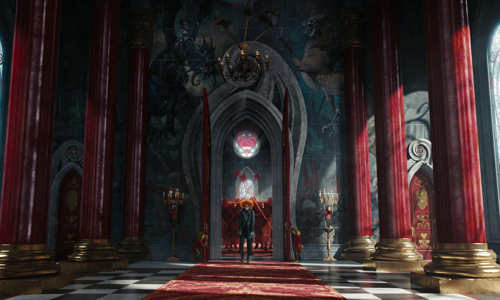

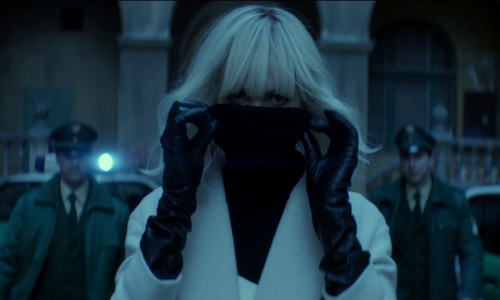

In [ ]:
f1   = files[0]
f2   = files[1]
img1 = PIL.Image.open(f1).resize((500,300))
img2 = PIL.Image.open(f2).resize((500,300))
img1
img2

In [ ]:
to_img  = lambda x:   PILImage.create(x)
as_arr  = lambda x:   np.array(x)
aug     = lambda op,img: op(image=as_arr(img))['image']
aug_img = lambda op,img: to_img(aug(op,img))

def compose_augs(augs:list, img:PIL.Image.Image):
    if not isinstance(augs, list): augs=[augs]
    for aug in augs:
        img = aug_img(aug,img)
    return img

### Blurring Transforms

One Of
* Blur
* MotionBlur

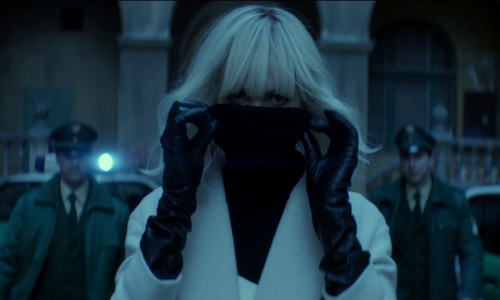

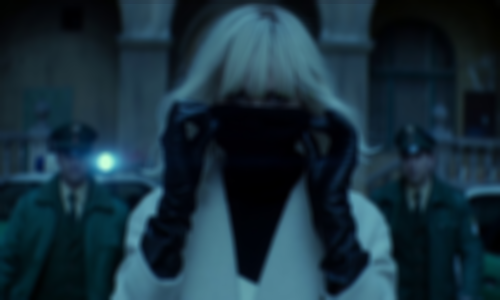

In [ ]:
blur = Blur(always_apply=True)

img2
aug_img(blur, img2)

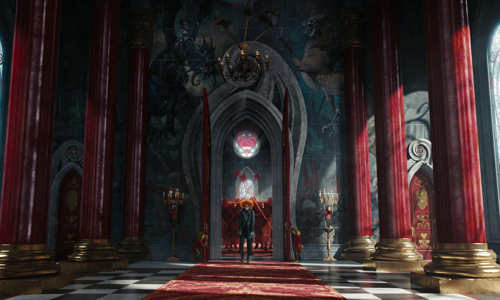

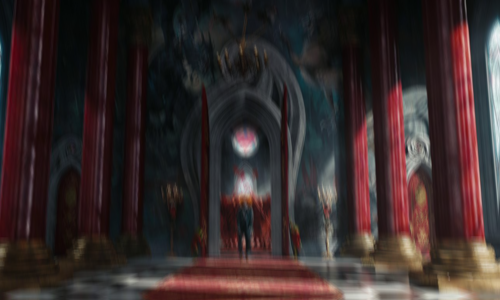

In [ ]:
motion_blur = MotionBlur(blur_limit=(15,15), always_apply=True)

img1
aug_img(motion_blur, img1)

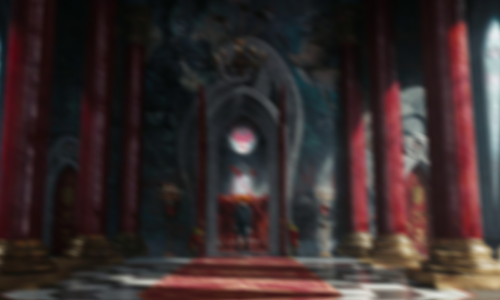

In [ ]:
compose_augs([blur, motion_blur], img1)

### Style Transfer-Esque

* MedianBlur
* IAAAEmboss

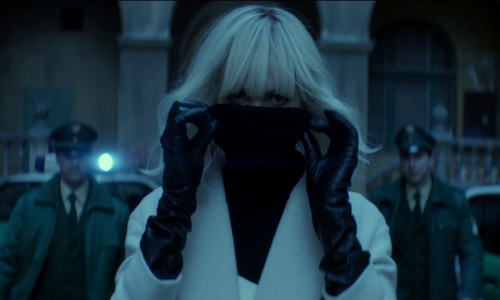

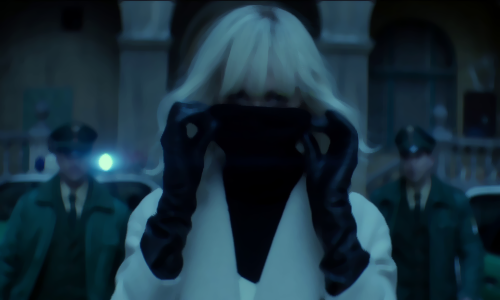

In [ ]:
median_blur = MedianBlur(blur_limit=(3,7), always_apply=True)

img2
aug_img(median_blur, img2)

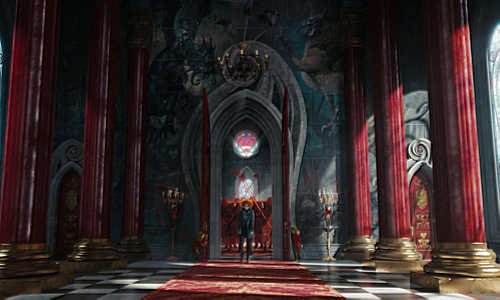

In [ ]:
emboss = IAAEmboss(strength=(0.2,0.99), always_apply=True)
aug_img(emboss, img1)

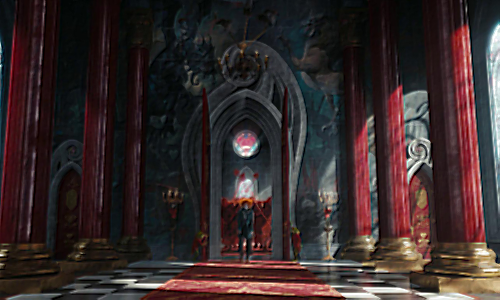

In [ ]:
compose_augs([median_blur, emboss], img1)

### Other

* FancyPCA

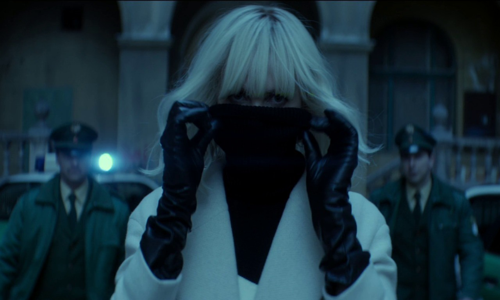

In [ ]:
pca = FancyPCA(always_apply=True)
aug_img(pca, img2)

### Color Tones

* Solarize
* ToGray
* Sepia

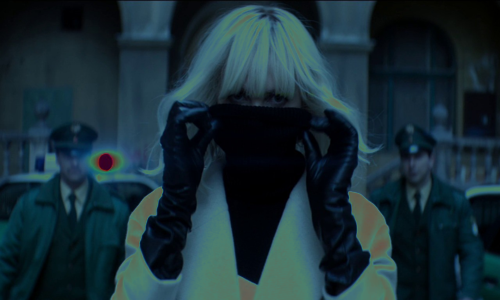

In [ ]:
#nope
solarize = A.Solarize(always_apply=True)
aug_img(solarize, img2)

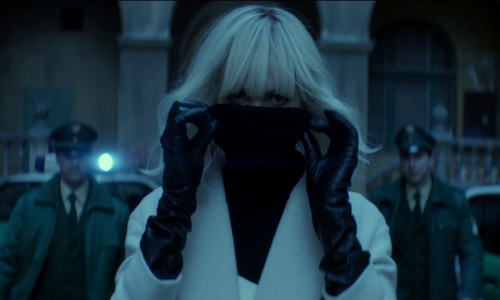

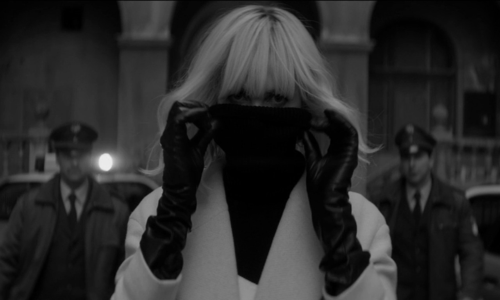

In [ ]:
gray = ToGray(always_apply=True)
img2
aug_img(gray, img2)

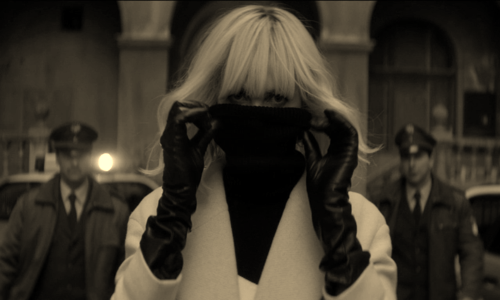

In [ ]:
sepia = ToSepia(always_apply=True)
aug_img(sepia, img2)

### Noise


One of:
* IAAAAdditiveGaussianNoise
* GaussNoise

* JpegCompress

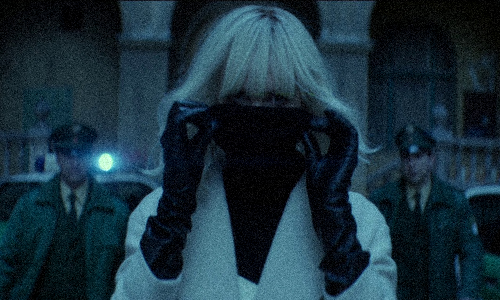

In [ ]:
tfm = IAAAdditiveGaussianNoise(always_apply=True)

aug_img(tfm, img2)

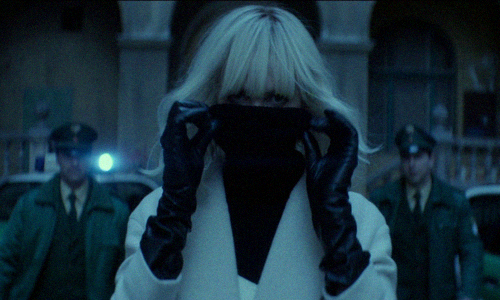

In [ ]:
gauss_noise = GaussNoise(always_apply=True)
aug_img(gauss_noise, img2)

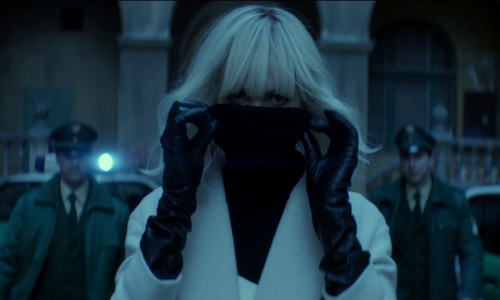

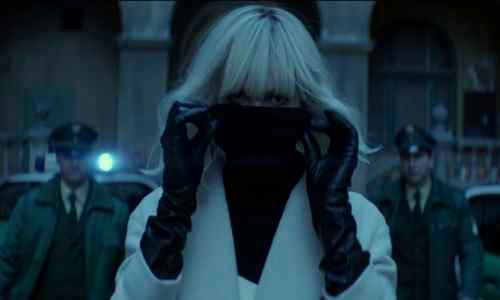

In [ ]:
jpeg_compress = JpegCompression(quality_lower=25, quality_upper=55, always_apply=True)
img2
aug_img(jpeg_compress, img2)

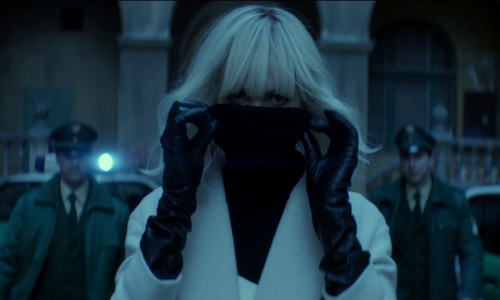

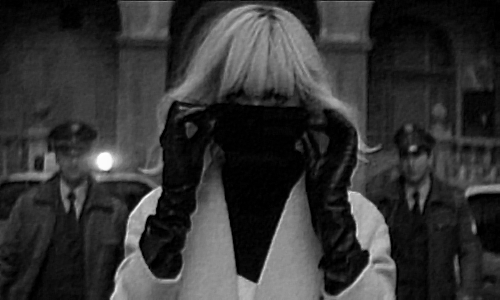

In [ ]:
img2
compose_augs([jpeg_compress, gauss_noise, median_blur, sepia, emboss, gray], img2)

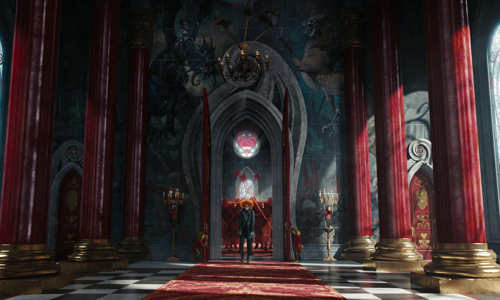

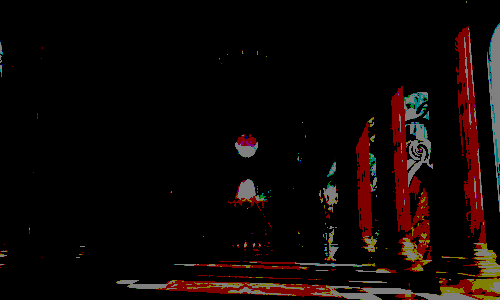

In [ ]:
#nope
posterize = Posterize(True)
img1
aug_img(posterize, img1)

### Weather Transforms

* Sun Flare

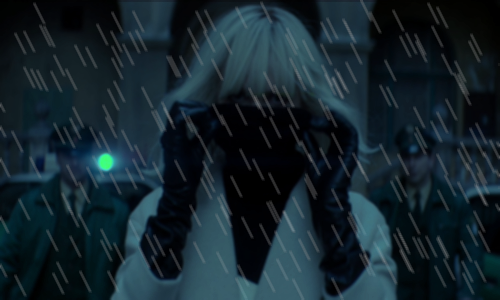

In [ ]:
rain = A.RandomRain(always_apply=True, blur_value=3)

aug_img(rain, img2)

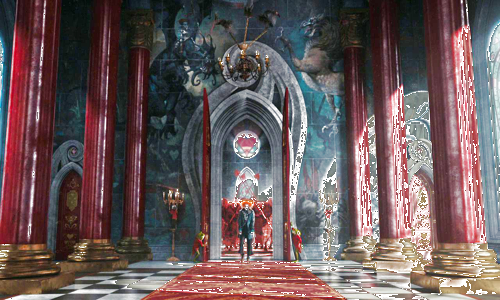

In [ ]:
snow = A.RandomSnow(always_apply=True)
aug_img(snow, img1)

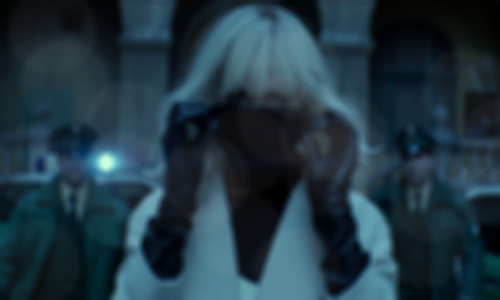

In [ ]:
fog = A.RandomFog(always_apply=True)
aug_img(fog, img2)

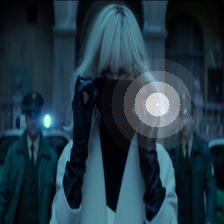

In [ ]:
sun_flare = A.RandomSunFlare(always_apply=True, src_radius=80)
aug_img(sun_flare, img2.resize((224,224)))

### Lighting Transforms

* RandomContrast
* RandomBrightness
* CLAHE

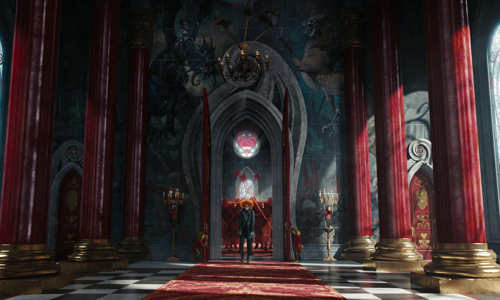

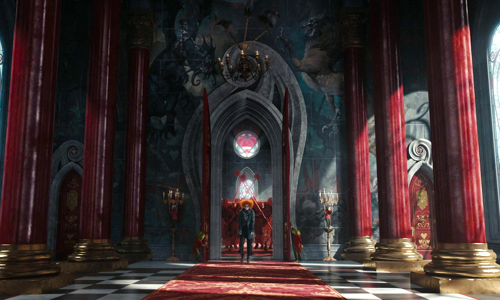

In [ ]:
random_contrast = RandomContrast(always_apply=True)
img1
aug_img(random_contrast, img1)

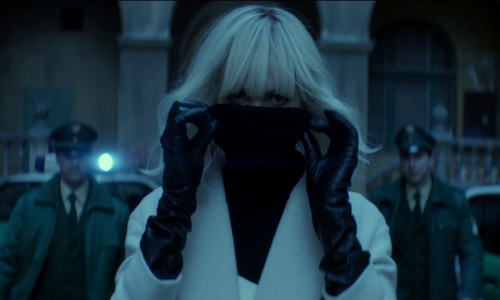

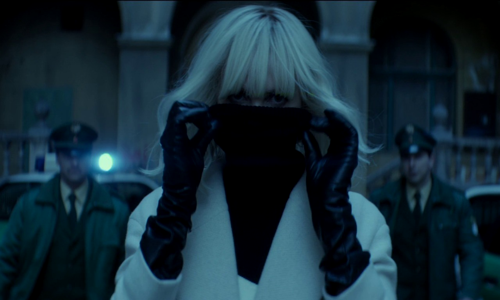

In [ ]:
random_brightness = RandomBrightness(0.05, always_apply=True)
img2
aug_img(random_brightness, img2)

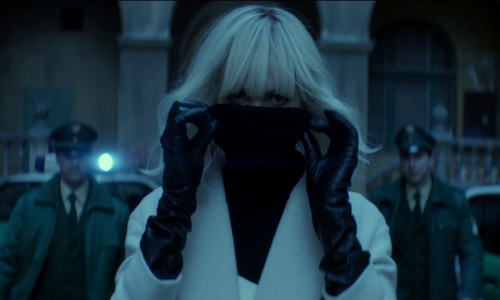

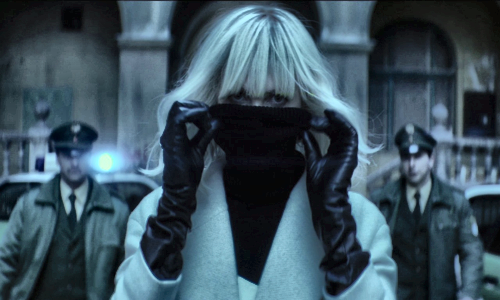

In [ ]:
clahe = CLAHE(always_apply=True)

img2
aug_img(clahe, img2)

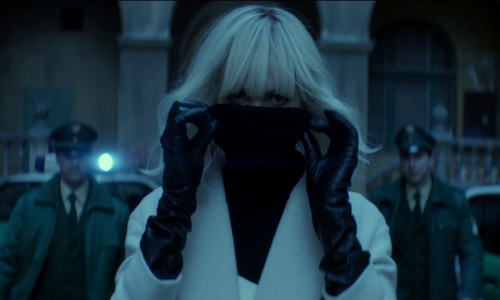

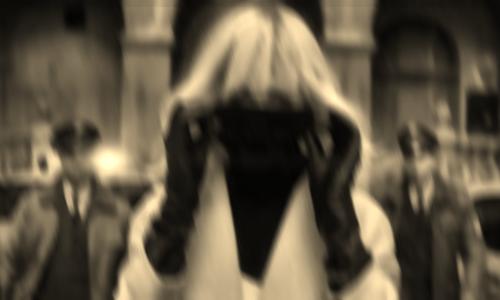

In [ ]:
img2
compose_augs([clahe, median_blur, jpeg_compress, motion_blur, sepia], img2)

### Channel Level Transforms

* ChannelShuffle
* HueSaturationValue
* RGBShift

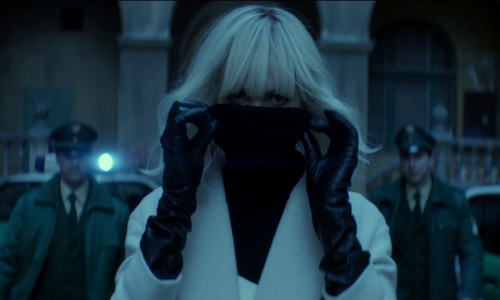

In [ ]:
channel_shuffle = ChannelShuffle(always_apply=True)
aug_img(channel_shuffle,img2)

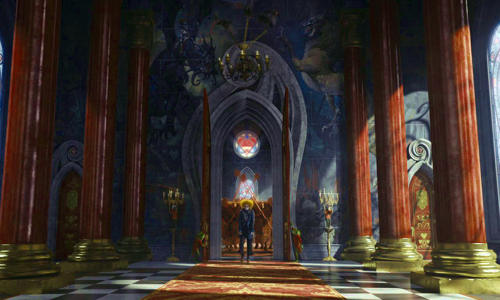

In [ ]:
hsv = HueSaturationValue(val_shift_limit=10)
aug_img(hsv, img1)

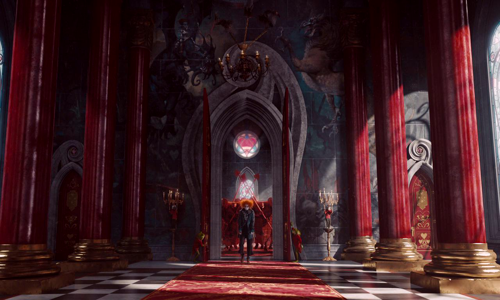

In [ ]:
rgb_shift = RGBShift(always_apply=True)
aug_img(rgb_shift, img1)

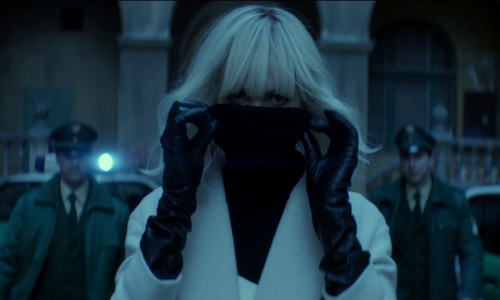

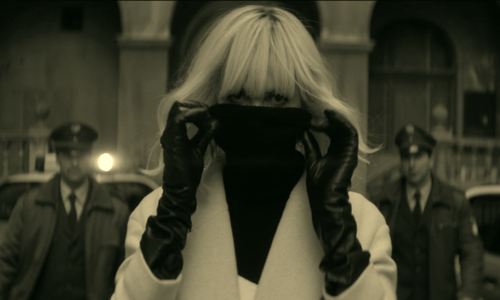

In [ ]:
img2
compose_augs([sepia, rgb_shift, channel_shuffle], img2)

### Merging With FastAI

In [ ]:
rgb_or_sepia = OneOf([
    RGBShift(p=0.5),
    ToSepia(p=0.5)
], p=1.0)

In [ ]:
def albu_augment(aug, img): return aug(image=np.array(img))['image']

##https://dev.fast.ai/tutorial.pets
class AlbumentationsWrapper(Transform):
    "Wrapper function for any Albumentations Transform"
    order=0 # apply before `ToTensor`
    def __init__(self, aug): self.aug=aug
    def __repr__(self): return self.aug.__repr__()
    
    def _encodes(self, img:PILImage):
        aug_img = albu_augment(self.aug, img)
        return PILImage.create(aug_img)
    
    def encodes(self, img:PIL.Image.Image): return self._encodes(img)
    def encodes(self, img:PILImage): return self._encodes(img)
    def encodes(self, o:(str,Path)): return self._encodes(PILImage.create(o))

In [ ]:
tmptfm = AlbumentationsTransform(rgb_or_sepia)
img2 = PILImage.create(f2)
img2.resize((500,300))
tmptfm(img2).resize((500,300))

In [ ]:
#hide
from nbdev.showdoc import *

In [ ]:
ColorChannelTfms = OneOf([
    ChannelShuffle(),
    HueSaturationValue(val_shift_limit=5), 
    RGBShift()
])

In [ ]:
luts   = [read_lut(f) for f in get_files('../assets/luts/', extensions='.cube')]
fnames = get_image_files('../assets')

In [ ]:
%%capture

f = fnames[2]
filt     = ApplyPILFilter(luts[2], p=1.) # pass in only one filter
img_raw  = PILImage.create(f)
img_filt = filt(f, split_idx=0)

fig,ax = plt.subplots(nrows=1, ncols=2, figsize=(16,6))
show_tensor = lambda x,ax: ToTensor()(x).show(ctx=ax)

show_tensor(img_raw,ax[0]); show_tensor(img_filt,ax[1])

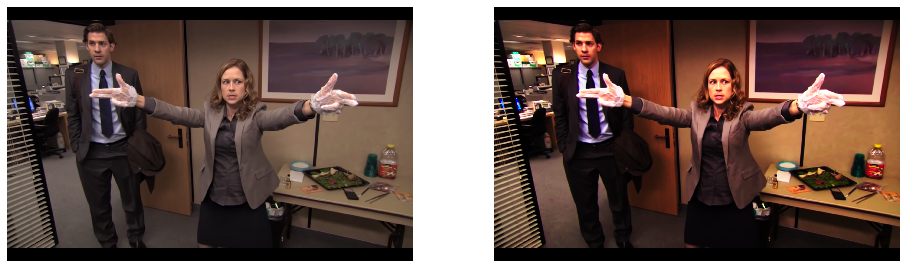

In [ ]:
fig

Note that we're now passing in a list `luts` to `ApplyPILFilter`, so every time it's called, a random item from `luts` is applied to the image.

For the purpose of showing the augs happen, I create multiple copies of the same image offline. <br>

In [ ]:
dblock = DataBlock(
    blocks     = (ImageBlock, CategoryBlock),
    get_items  = get_image_files,
    get_x      = Pipeline([PILImage.create, ApplyPILFilter(luts, p=1.)]),
    get_y      = parent_label,
    splitter   = RandomSplitter(seed=42, valid_pct=0.),
    item_tfms  = [Resize(size=224, method=ResizeMethod.Squish, pad_mode=PadMode.Zeros)],
    batch_tfms = [Normalize.from_stats(*imagenet_stats)]
)

In [ ]:
dls = dblock.dataloaders('../assets/imgs', bs=15)

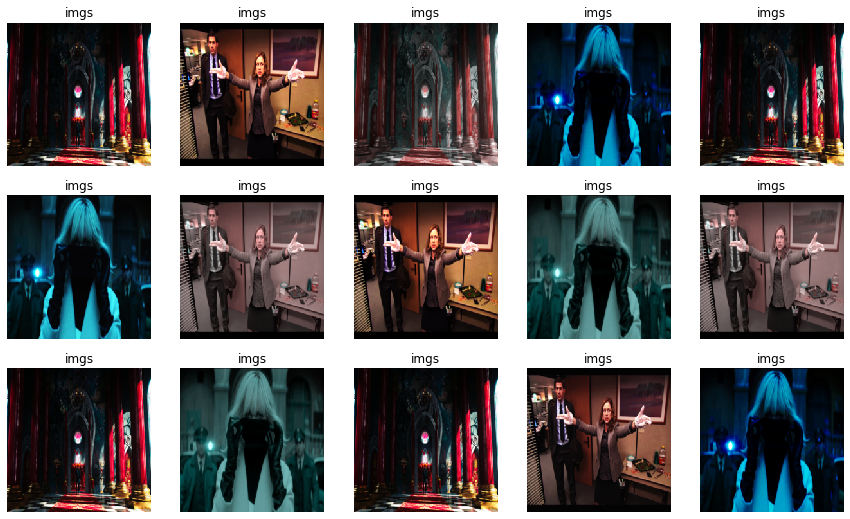

In [ ]:
dls.show_batch(max_n=15)